In [7]:
import glob

import numpy as np
import pandas as pd
from scipy.spatial.distance import squareform, pdist
from tmap.tda import Filter
import plotly.graph_objs as go
from tmap.netx.SAFE import get_significant_nodes
from collections import Counter

pd.options.display.expand_frame_repr = False
pd.options.display.max_rows = 1000
import scipy.stats as scs
import numpy as np
import warnings
import plotly

warnings.filterwarnings('ignore')
plotly.offline.init_notebook_mode()

In [8]:
print(plotly.__version__),print(pd.__version__)

3.7.1
0.24.2


(None, None)

In [9]:
input_otu = pd.read_csv("FGFP_genus_data.csv",index_col=0)
metadata = pd.read_csv('FGFP_metadata_ready.csv',index_col=0)
metadata_category = pd.read_csv('FGFP_metadata_category.csv',index_col=0,sep=',')

In [10]:
metadata = metadata.apply(lambda x:x.fillna(np.nanmedian(x)),axis=0)
print(metadata.shape)

(1106, 174)


In [11]:
metadata.head()

,Age,Body_mass_index,Height,Cigarettes_.average.day_past_3_months.,Hemoglobine,Red_blood_cell_count,Mean_corpuscular_hemoglobin_concentration,HOMA.IR,Blood_urea,Creatinine,...,Soy_products_.average_past_week.:nutrition.consumption.option.2,Soy_products_.average_past_week.:nutrition.consumption.option.5,Soy_products_.average_past_week.:shortanswer.doesnot.apply,Soy_products_.average_past_week.:nutrition.consumption.option.4,Soy_products_.average_past_week.:nutrition.consumption.option.1,Soy_products_.average_past_week.:nutrition.consumption.option.3,Soy_products_.average_past_week.:nutrition.consumption.option.6,Shift_work:False,Shift_work:True,Shift_work:nan
FGFP58455,27.0,18.906901,169.0,0.0,13.8,4.59,33.0,1.273827,16.1,0.83,...,0,0,0,0,1,0,0,1,0,0
FGFP14803,66.0,19.433013,162.0,0.0,13.4,4.38,34.0,1.098765,31.3,0.83,...,0,0,1,0,0,0,0,1,0,0
FGFP80308,52.0,28.177109,174.5,0.0,15.2,5.08,34.0,1.512593,35.0,0.81,...,0,0,0,0,1,0,0,1,0,0
FGFP6462,53.0,20.598608,179.0,0.0,13.7,4.46,34.0,0.527407,37.0,0.72,...,0,0,1,0,0,0,0,1,0,0
FGFP59089,43.0,23.838384,165.0,0.0,12.9,4.30,33.0,1.512593,20.8,0.66,...,0,0,1,0,0,0,0,1,0,0


In [12]:
metadata_category.head()

,Category
Age,Anthropometric
Body_mass_index,Anthropometric
Height,Anthropometric
Cigarettes_.average.day_past_3_months.,Lifestyle
Hemoglobine,BloodParameters


# Generate result of envfit

In [13]:
input_otu.to_csv('envfit/test.otu.csv',index=True)
metadata.astype(float).to_csv('envfit/test.metadata.csv',index=True)

In [14]:
import rpy2.robjects as robjects
from rpy2.robjects.packages import importr

importr("vegan")

def envfit_metadata(genus_path,metadata_path,return_ord = False):
    rcode = """
    genus_table <- read.csv('{path_data}',row.names = 1)
    metadata <- read.csv('{path_metadata}',row.names = 1,check.names=FALSE)
    bray <- vegdist(genus_table)
    ord <- capscale(bray ~ -1)

    """.format(path_data=genus_path,path_metadata=metadata_path)
    robjects.r(rcode)

    envfit_result = robjects.r(
    """
    fit <- envfit(ord,metadata,permutations = 10000)
    fit$vectors
    """)
    R_ord = robjects.r('summary(ord)$sites')
    R_pro_X_df = pd.DataFrame(data=np.array(R_ord),index=R_ord.rownames,columns=R_ord.colnames)
    fit_result = pd.DataFrame(columns=["r2","pvals","Source","End"],index=envfit_result[envfit_result.names.index("arrows")].rownames)
    fit_result.loc[:,"r2"] = envfit_result[envfit_result.names.index("r")]
    fit_result.loc[:, "pvals"] = envfit_result[envfit_result.names.index("pvals")]
    fit_result.loc[:, ["Source","End"]] = np.array(envfit_result[envfit_result.names.index("arrows")])
    if return_ord:
        return fit_result,R_pro_X_df
    else:
        return fit_result
    
import time
t1 = time.time()
fit_result,R_pro_X_df = envfit_metadata('envfit/test.otu.csv',
                                     'envfit/test.metadata.csv',
                                    return_ord=True)
print('envfit takes', time.time() - t1)

envfit takes 802.5616490840912


In [15]:
color_codes = {'Anthropometric': '#88ddcc',
 'BloodParameters': '#cc6666',
 'Bowel Habit': '#ddddee',
 'DietaryHabit': '#ffbb66',
 'Genus': 'red',
 'Health': '#4488bb',
 'Health(Medication)': '#ff88bb',
 'Lifestyle': '#bbdd66',
 'Special': '#999999'}

## simple API for generate Graph of tmap

In [16]:
from tmap.tda import mapper
from tmap.tda.metric import Metric
from tmap.tda.cover import Cover
from tmap.tda.utils import optimize_dbscan_eps
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import MinMaxScaler
dis = squareform(pdist(input_otu, metric="braycurtis"))

tm = mapper.Mapper(verbose=1)
metric = Metric(metric="precomputed")
lens = [Filter.PCOA(components=[0, 1], metric=metric, random_state=100)]
projected_X = tm.filter(dis, lens=lens)
eps = optimize_dbscan_eps(input_otu, threshold=95)
clusterer = DBSCAN(eps=eps, min_samples=3)
cover = Cover(projected_data=MinMaxScaler().fit_transform(projected_X), resolution=40, overlap=0.75)
graph = tm.map(data=input_otu, cover=cover, clusterer=clusterer)

Filtering by PCOA.
...calculate Filter(which used to create cover) using the provided precomputed lens.
Filtering has been completed.


 37%|███▋      | 587/1600 [00:00<00:00, 5859.05it/s]

Mapping on data (1106, 421) using lens (1106, 2)
...minimal number of points in hypercube to do clustering: 3


100%|██████████| 1600/1600 [00:00<00:00, 2187.63it/s]


...create 592 nodes.
...calculate projection coordinates of nodes.
...construct a TDA graph.
...create 4176 edges.
Finish TDA mapping


In [17]:
print(graph.info())


Graph
Contains 592 nodes and 934 samples
During constructing graph, 172 (84.45%) samples lost

Used params:

cluster params
p: None
eps: 1521.7313845597491
metric: euclidean
min_samples: 3
algorithm: auto
n_jobs: 1
metric_params: None
leaf_size: 30
cover params
r: 40
overlap: 0.75
lens params
lens_0:
metric: precomputed
components: [0, 1]




## Generate SAFE score

In [18]:
from tmap.netx.SAFE import SAFE_batch,get_SAFE_summary
from tmap.tda.plot import vis_progressX,Color
n_iter = 5000
safe_scores = SAFE_batch(graph,metadata = metadata,n_iter=n_iter,nr_threshold=0.5,_mode='both')
enriched_SAFE_metadata,declined_SAFE_metadata = safe_scores['enrich'],safe_scores['decline']

100%|██████████| 5000/5000 [08:21<00:00, 10.18it/s]


In [19]:
from tmap.netx.SAFE import SAFE_batch,get_SAFE_summary
from tmap.tda.plot import vis_progressX,Color
n_iter = 5000
safe_scores = SAFE_batch(graph,metadata = input_otu,n_iter=n_iter,nr_threshold=0.5,_mode='both')
enriched_SAFE,declined_SAFE = safe_scores['enrich'],safe_scores['decline']

100%|██████████| 5000/5000 [19:00<00:00,  4.31it/s]


In [20]:
safe_summary_metadata = get_SAFE_summary(graph=graph, metadata=metadata, safe_scores=enriched_SAFE_metadata,
                                n_iter=n_iter, p_value=0.05)
safe_summary = get_SAFE_summary(graph=graph, metadata=input_otu, safe_scores=enriched_SAFE,
                                n_iter=n_iter, p_value=0.05)

In [21]:
safe_summary.sort_values('SAFE enriched score',ascending=False).to_csv('result/FGFP Genus SAFE summary.csv')
compared_table = safe_summary_metadata
compared_table.loc[:,'Category'] = metadata_category.loc[safe_summary_metadata.index,'Category']
compared_table.sort_values('SAFE enriched score',ascending=False).to_csv('result/FGFP covariate SAFE summary.csv')

In [22]:
enriched_SAFE_total = pd.concat([enriched_SAFE,enriched_SAFE_metadata],axis=1)
safe_summary_total = pd.concat([safe_summary_metadata,safe_summary],axis=0)

In [23]:
node_data = graph.transform_sn(input_otu)
nodes_metadata = graph.transform_sn(metadata)

## Draw PCoA which is based on SAFE score (For both Metadata and Genus)

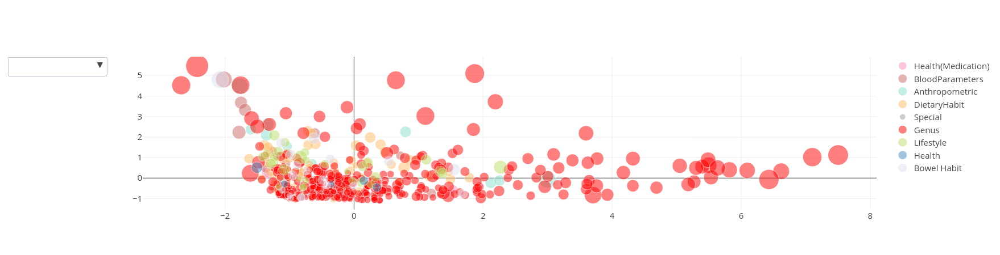

In [24]:
import plotly
from plotly import graph_objs as go
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler

metadata_category = metadata_category.reindex(enriched_SAFE_total.columns)
metadata_category.loc[metadata_category.index.isin(input_otu.columns), 'Category'] = 'Genus'

pca = PCA()
pca_result = pca.fit_transform(enriched_SAFE_total.T)

top_metadata = list(safe_summary_metadata.sort_values('SAFE enriched score', ascending=False).index[:10])
top_genus = list(safe_summary.sort_values('SAFE enriched score', ascending=False).index[:10])
mx_scale = MinMaxScaler(feature_range=(10, 40)).fit(safe_summary_total.loc[:, ["SAFE enriched score"]])

data = []
for cat in set(metadata_category.loc[:, 'Category']):
    vals = safe_summary_total.loc[metadata_category.index[metadata_category.Category == cat], ["SAFE enriched score"]]
    data.append(go.Scatter(x=pca_result[metadata_category.Category == cat, 0],
                           y=pca_result[metadata_category.Category == cat, 1],
                           mode="markers",
                           # legendgroup=''
                           name=cat,
                           marker=dict(  color=color_codes[cat],
                               size=mx_scale.transform(vals),
                               opacity=0.5),
                           text=metadata_category.index[metadata_category.Category == cat]))

data.append(go.Scatter(x=pca_result[:,0],
                       y=pca_result[:,1],
                       #visible=False,
                       mode="text",
                       hoverinfo='none',
                       textposition="middle center",
                       name='name for searching',
                       showlegend=False,
                       textfont=dict(size=13),
                        text=''))

traces_index = {trace.name: idx for idx, trace in enumerate(data) if trace['name'] in metadata_category.Category.unique()}
reset_buttons = [dict(args=[{'text':[' ']},{},str(len(data)-1)], label='ClearAll', method='update')]
all_buttons = [dict(args=[{'text':[enriched_SAFE_total.columns]},{},str(len(data)-1)], label='ShowAll', method='update')]

updatemenus = [dict(active=-1,
                    buttons=[dict(args=['text',[_trace.text for _trace in data if _trace.name in traces_index] + [[each if metadata_category.loc[each,'Category'] ==cat else ' ' for each in enriched_SAFE_total.columns]]
                                       ]
                                  , label=cat, method='restyle') for cat in metadata_category.Category.unique().tolist()] + reset_buttons + all_buttons,
                    ),
               ]

layout = dict(xaxis=dict(title="PC1({:.2f}%)".format(pca.explained_variance_ratio_[0] * 100)),
              yaxis=dict(title="PC2({:.2f}%)".format(pca.explained_variance_ratio_[1] * 100)),
              title="SAFE total enriched score based PCA (FGFP metadata+genus)",
              font=dict(size=15),
              hovermode='closest',
              updatemenus=updatemenus)
#plotly.offline.iplot(dict(data=data, layout=layout), )
plotly.offline.plot(dict(data=data,layout=layout),
                    filename="result/SAFE total enriched score based PCA.html",
                    auto_open=False)
plotly.offline.iplot(dict(data=data, layout=layout), )

# Figure 3a.Host covariates ranking, compared with the FGFP's

In [25]:
node_data = graph.transform_sn(input_otu)
nodes_metadata = graph.transform_sn(metadata)

In [26]:
original_result = pd.read_excel('Compared/Table_S5.xlsx',header=1,index_col=1)

order_new_columns = []
for i in compared_table.index:
    if i not in original_result.index:
        cache = list(i.split(':')[0])
        cache = sorted([(len(set(cache).intersection(set(list(_)))), _, i) for _ in original_result.index], reverse=True)
        if cache[0][0] == cache[1][0]:
            max_one = [_ for _ in cache if _[0] == cache[0][0]]
            max_one = [(_[0] / len(set(_[1])), _[1], _[2]) for _ in max_one]
            order_new_columns.append(sorted(max_one)[-1][1])
        else:
            order_new_columns.append(cache[0][1])
    else:
        order_new_columns.append(i)
dict_columns = dict(zip(compared_table.index,order_new_columns))
compared_table = pd.DataFrame(columns=['SAFE enriched score','R'],index=safe_summary_metadata.sort_values('SAFE enriched score',ascending=False).index)
compared_table.loc[:,'SAFE enriched score'] = list(safe_summary_metadata.sort_values('SAFE enriched score',ascending=False).loc[:,'SAFE enriched score'])
compared_table.loc[:,'original R'] = [original_result.loc[dict_columns[_],'R'] for _ in compared_table.index]
compared_table.loc[:,'R'] = list(fit_result.reindex(safe_summary_metadata.sort_values('SAFE enriched score',ascending=False).index).loc[:,'r2'])
compared_table = compared_table.fillna(0)
compared_table.to_csv('result/Compared table.csv',index=True)

In [27]:
from scipy.stats import weightedtau,kendalltau

compared_table.loc[:,'kendalltau_test_pvalue'] = 0
compared_table.loc[:,'kendalltau_test_correlation'] = None
for num in range(2,compared_table.shape[0]):
    xs = compared_table.iloc[:num,0]
    ys = compared_table.iloc[:num,1]
    
    xs = [compared_table.sort_values(compared_table.columns[0],ascending=False).iloc[:,0].values.tolist().index(_) for _ in xs]
    ys = [compared_table.sort_values(compared_table.columns[1],ascending=False).iloc[:,1].values.tolist().index(_) for _ in ys]
    test_obj = kendalltau(xs,ys)
    compared_table.loc[compared_table.index[num],'kendalltau_test_pvalue'] = test_obj.pvalue
    compared_table.loc[compared_table.index[num],'kendalltau_test_correlation'] = test_obj.correlation
    #print(weightedtau(xs,ys))

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y1 ]  [ (1,3) x3,y1 ]  [ (1,4) x4,y1 ]



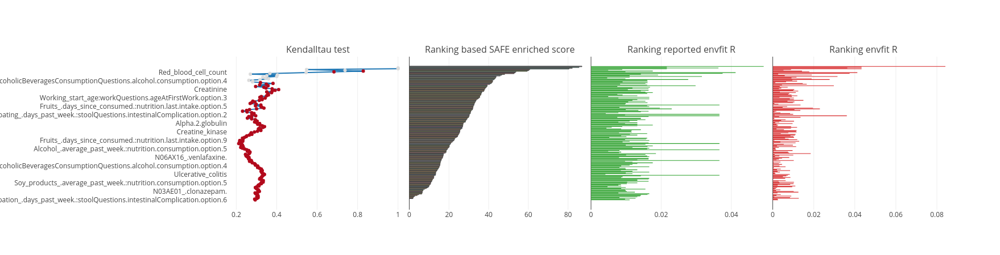

In [28]:
from plotly import tools
fig = tools.make_subplots(1,4,shared_yaxes=True,horizontal_spacing=0,subplot_titles=['Kendalltau test',
                                                                                     'Ranking based SAFE enriched score',
                                                                                     'Ranking reported envfit R',
                                                                                     'Ranking envfit R'])

sorted_df = safe_summary_metadata.sort_values('SAFE enriched score',ascending=False)
fig.append_trace(go.Scatter(x = compared_table.loc[:,'kendalltau_test_correlation'],
                             y =compared_table.index, 
                            mode='markers+lines',
                           marker=dict(color = [1 if _<=0.05 else 0 for _ in compared_table.loc[:,'kendalltau_test_pvalue']],
                                  ),
                       showlegend=False),1,1)
fig.append_trace(go.Bar(x = compared_table.loc[:,'SAFE enriched score'],
                        y =compared_table.index, 
                       marker=dict(color = [color_codes[metadata_category.loc[fea,'Category']] for fea in sorted_df.index],
                                  line=dict(width=1)),
                        orientation = 'h',
                       showlegend=False),1,2)
fig.append_trace(go.Bar(x=compared_table.loc[:,'original R'],
                        y=compared_table.index, 
                        orientation = 'h',
                       showlegend=False),1,3)
fig.append_trace(go.Bar(x=compared_table.loc[:,'R'],
                        y=compared_table.index, 
                        orientation = 'h',
                       showlegend=False),1,4)

fig.layout.yaxis.autorange= 'reversed'
fig.layout.margin.l = 400
fig.layout.height = 1500
plotly.offline.iplot(fig)#filename='fig4a.compared Bar plot.html',auto_open=False)
plotly.offline.plot(fig,filename='result/compared Bar plot.html',auto_open=False)
bar_plot2_table = pd.DataFrame(index=sorted_df.index,columns=['Ranking based SAFE enriched score',
                                                                                    'Ranking reported envfit R',
                                                                                    'Ranking envfit R'])
bar_plot2_table.loc[:,'Ranking based SAFE enriched score'] = sorted_df.loc[:,'SAFE enriched score']
bar_plot2_table.loc[:,'Ranking reported envfit R'] = input_otu.apply(lambda x:len(x[x!=0])/len(x),axis=0)[sorted_df.index]
bar_plot2_table.loc[:,'Ranking envfit R'] = input_otu.div(input_otu.sum(1),axis=0).sum(0)[sorted_df.index]
compared_table.to_csv("result/Bar raw data.csv")

# Fig.3c pair draw original values of feature and corresponding SAFE values.

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]

This is the format of your plot grid:
[ (1,1) x1,y1 ]

This is the format of your plot grid:
[ (1,1) x1,y1 ]



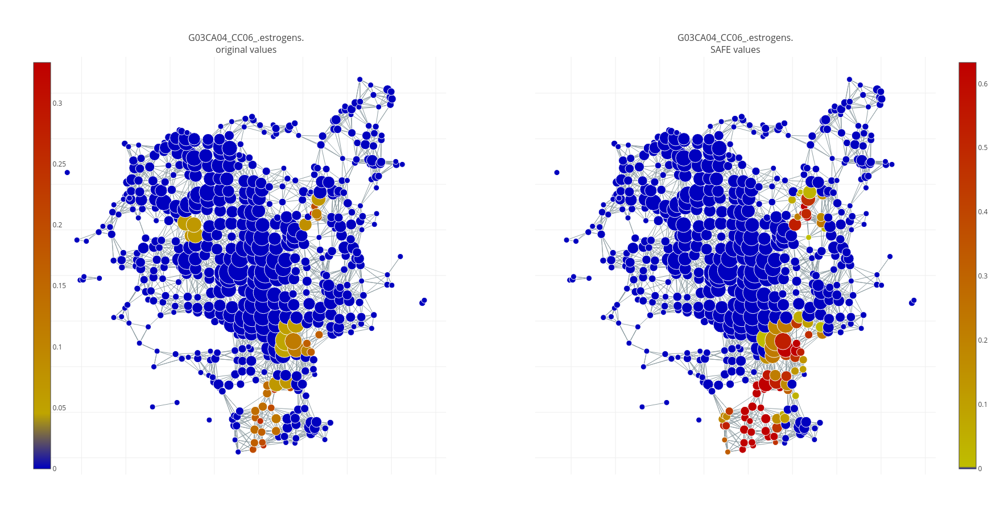

In [29]:
import plotly
fea1 = 'G03CA04_CC06_.estrogens.'
fig = plotly.tools.make_subplots(1,2,subplot_titles=['{}<Br>original values'.format(fea1),'{}<Br>SAFE values'.format(fea1)])
# fea2 = 'A07EC02_.mesalazine.'
color1 = Color(metadata.loc[:,fea1],target_by='sample',dtype='numerical')
color2 = Color(enriched_SAFE_total.loc[:,fea1],target_by='node',dtype='numerical')
_d = vis_progressX(graph,color=color1,simple=True,mode='obj')
_d2 = vis_progressX(graph,color=color2,simple=True,mode='obj')
fig.append_trace(_d.data[0],1,1)
_d.data[1]['marker']['colorbar']['x'] = -0.02
fig.append_trace(_d.data[1],1,1)
for _ in _d2.data:
    fig.append_trace(_,1,2)

    
fig.layout.width =1800
fig.layout.height=900
fig.layout.xaxis1.showticklabels = False
fig.layout.yaxis1.showticklabels = False
fig.layout.xaxis2.showticklabels = False
fig.layout.yaxis2.showticklabels = False

fig.layout.xaxis1.zeroline = False
fig.layout.yaxis1.zeroline = False
fig.layout.xaxis2.zeroline = False
fig.layout.yaxis2.zeroline = False
fig.layout.hovermode = 'closest'
plotly.offline.iplot(fig)

## Visualization which shows the real variation along with the envfit arrow.

In [30]:
def pos_transformation(source,end,projected_X,metadata_y):
    
    x_cor = np.array([source,end])
    y_cor = np.array([-end,source])
    length_cor = np.sum(x_cor**2)
    k_x = np.apply_along_axis(lambda x:np.dot(x_cor,x),1,projected_X)/length_cor
    k_y = np.apply_along_axis(lambda x:np.dot(y_cor,x),1,projected_X)/length_cor
    transformed_pos = np.concatenate([k_x.reshape(-1,1),k_y.reshape(-1,1)],1)
    

    tmp = sorted(zip(transformed_pos[:,0],metadata_y))
    data_x,data_y = [_[0] for _ in tmp],[_[1] for _ in tmp]
    
    return data_x,data_y

def smooth_lines(y,n_bin,mode='std'):
    data_y = []
    y = np.array(y)
    min_x,max_x = np.min(y),np.max(y)
    bin_size = (max_x - min_x) /float(n_bin)
    for i in range(n_bin+1):
        l_bound = min_x + i * bin_size
        r_bound = min_x + (i+1) * bin_size
        conditions = (y >= l_bound) & (y < r_bound)
        cond_y = y[conditions]
        if mode == 'std':
            _y = cond_y.std(ddof=1)
        data_y += list(np.repeat(y,len(cond_y)))
    return data_y
        

In [31]:
enriched_SAFE_total.shape

(592, 595)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



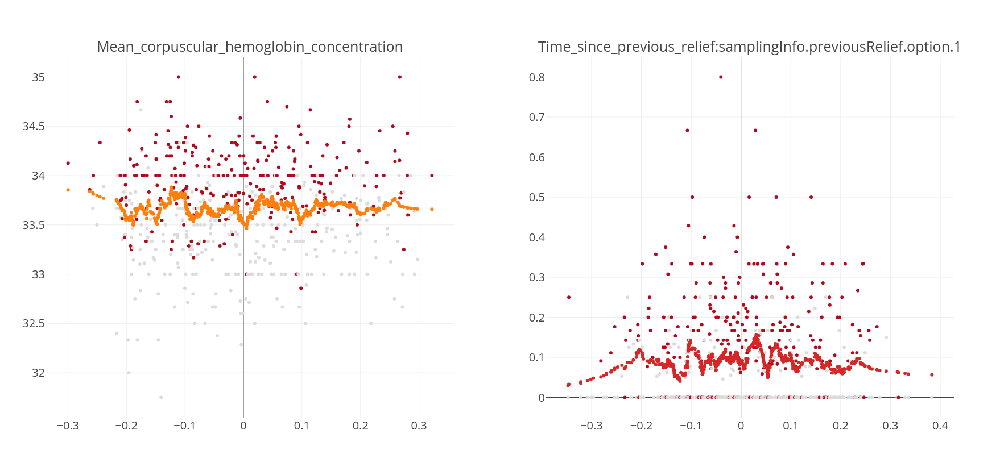

In [33]:
from scipy.signal import savgol_filter

fea1 = 'Mean_corpuscular_hemoglobin_concentration'
fea2 = 'Time_since_previous_relief:samplingInfo.previousRelief.option.1'

source,end = fit_result.loc[fea1,['Source','End']].values
data_x,index_y = pos_transformation(source,end,projected_X,nodes_metadata.index)
data_y = nodes_metadata.loc[index_y,fea1]

fig = tools.make_subplots(1,2,subplot_titles=[fea1,fea2])
fig.append_trace(go.Scatter(x=data_x,
                            y=data_y,
                            mode='markers',
                            marker=dict(color=[1 if enriched_SAFE_total.loc[i,fea1]!=0 else 0 for i in index_y]),
                            showlegend=False),1,1)
yhat = savgol_filter(data_y, 31, 1)
# yhat = smooth_lines(data_y,11)
fig.append_trace(go.Scatter(x=data_x,y=yhat,mode='markers',
                            showlegend=False),1,1)


source,end = fit_result.loc[fea2,['Source','End']].values
data_x,index_y = pos_transformation(source,end,projected_X,nodes_metadata.index)
data_y = nodes_metadata.loc[index_y,fea2]

fig.append_trace(go.Scatter(x=data_x,
                            y=data_y,
                            mode='markers',
                            marker=dict(color=[1 if enriched_SAFE_total.loc[i,fea2]!=0 else 0 for i in index_y]),
                            showlegend=False),1,2)
yhat = savgol_filter(data_y, 31, 1)
# yhat = smooth_lines(data_y,11)
fig.append_trace(go.Scatter(x=data_x,y=yhat,mode='markers',showlegend=False),1,2)

fig.layout.width = 2000
fig.layout.height = 800
fig.layout.font.update(dict(size=20))
fig.layout.annotations[0]['font'].update(dict(size=25))
fig.layout.annotations[1]['font'].update(dict(size=25))
plotly.offline.iplot(fig,)

# co-enrichment analysis

In [34]:
from tmap.netx.coenrichment_analysis import *
from tmap.tda.plot import draw_enriched_plot

In [35]:
enriched_centroides, enriched_nodes = get_significant_nodes(graph=graph,
                                                            safe_scores=enriched_SAFE_total,
                                                            n_iter=n_iter,
                                                            pvalue=0.05,
                                                            r_neighbor=True
                                                            )


In [36]:
for fea in tqdm(safe_summary_metadata.sort_values('SAFE enriched score',ascending=False).index[:5]):  # iterate the top 5 as examples
    global_correlative_feas, sub_correlative_feas, metainfo = coenrichment_for_nodes(graph=graph,
                                                                                     nodes=enriched_centroides[fea],
                                                                                     name=fea,
                                                                                     enriched_centroid=enriched_centroides,
                                                                                     safe_scores=enriched_SAFE_total,
                                                                                    _filter=True,
                                                                                    mode='both')
    global_corr_df, sub_corr_df = construct_correlative_metadata(fea=fea, 
                                                                 global_correlative_feas=global_correlative_feas, 
                                                                 sub_correlative_feas=sub_correlative_feas, 
                                                                 metainfo=metainfo, 
                                                                 node_data=pd.concat([node_data, nodes_metadata],axis=1),verbose=0)
    global_corr_df.loc[global_corr_df.loc[:,'ranksum in co-enriched nodes'] < 0.05,:].sort_values('fisher-exact test pvalue',ascending=True).to_csv('result/coenrichment/%s_global_corr.csv' % fea,index=False)
    sub_corr_df.loc[(sub_corr_df.comps_size >= 10) & (sub_corr_df.loc[:,'coenriched-others pvalue'] < 0.05),:].sort_values(['n_comps','coenriched-others pvalue'],ascending=True).to_csv('result/coenrichment/%s_sub_corr.csv' % fea,index=False)
    
    
    draw_enriched_plot(graph=graph,
                       safe_score=enriched_SAFE_total,
                       metainfo = metainfo,
                       fea = fea,
                       _filter_size=0,
                       filename='result/coenrichment/%s_comps.html' % fea,
                       auto_open=False,
                      )

  0%|          | 0/5 [00:00<?, ?it/s]

This is the format of your plot grid:
[ (1,1) x1,y1 ]

This is the format of your plot grid:
[ (1,1) x1,y1 ]



 20%|██        | 1/5 [00:13<00:52, 13.19s/it]

This is the format of your plot grid:
[ (1,1) x1,y1 ]

This is the format of your plot grid:
[ (1,1) x1,y1 ]



 40%|████      | 2/5 [00:30<00:43, 14.45s/it]

This is the format of your plot grid:
[ (1,1) x1,y1 ]

This is the format of your plot grid:
[ (1,1) x1,y1 ]



 60%|██████    | 3/5 [00:46<00:29, 14.85s/it]

This is the format of your plot grid:
[ (1,1) x1,y1 ]

This is the format of your plot grid:
[ (1,1) x1,y1 ]



 80%|████████  | 4/5 [01:02<00:15, 15.23s/it]

This is the format of your plot grid:
[ (1,1) x1,y1 ]

This is the format of your plot grid:
[ (1,1) x1,y1 ]



100%|██████████| 5/5 [01:12<00:00, 13.75s/it]


## perform pairwise co-enrichment relationship analysis.

In [37]:
corrected_fe_dis = pairwise_coenrichment(graph,
                               safe_scores=enriched_SAFE_total,
                               _pre_cal_enriched=enriched_centroides)

  0%|          | 0/595 [00:00<?, ?it/s]

building network...


100%|██████████| 595/595 [1:04:42<00:00, 10.17s/it]


In [38]:
import itertools
cutoff_val = np.percentile(corrected_fe_dis.values.reshape(-1,1),0.5)
edges = []
for f1,f2 in itertools.combinations(corrected_fe_dis.index,2):
    if corrected_fe_dis.loc[f1,f2] <= cutoff_val:
        edges.append((f1,f2,{'weight': 1- corrected_fe_dis.loc[f1,f2]}))

In [39]:
len(edges)

588

In [40]:
import networkx as nx
G = nx.from_edgelist(edges)
file_path = 'result/FGFP all genus and metadata.edges'
nx.write_edgelist(G,file_path)
import pandas as pd
edge_df = pd.read_csv(file_path,sep=' ',header=None)
edge_df.index = range(edge_df.shape[0])

all_nodes = list(set(list(edge_df.iloc[:,0]) + list(edge_df.iloc[:,1])))
node_df = pd.DataFrame(index=all_nodes,columns=['cat'] )
for idx in range(edge_df.shape[0]):
    source_name = edge_df.iloc[idx,0]
    end_name = edge_df.iloc[idx,1]
    
    edge_df.loc[idx,'weight'] = -np.log(corrected_fe_dis.loc[source_name,end_name])
    node_df.loc[source_name,"cat"] = metadata_category.loc[source_name,'Category']
    node_df.loc[end_name,"cat"] = metadata_category.loc[end_name,'Category']
node_df.index.name = 'feature'
edge_df = edge_df.drop([2,3],axis=1)
edge_df.columns = ['Source','End','weight']
edge_df.to_csv(file_path,index=False,sep='\t')
node_df.to_csv(file_path.replace('edge','node'),sep='\t')

## correlationship between Health, medication and genus

In [41]:
edges = []
tmp_dis = []
for f1,f2 in tqdm(itertools.combinations(corrected_fe_dis.index,2)):
    tmp_list = metadata_category.loc[[f1,f2],'Category'].values.tolist()
    if set(['Genus','Health','Health(Medication)']).intersection(set(tmp_list)) and corrected_fe_dis.loc[f1,f2] <= 0.05:
        edges.append((f1,f2,{'weight': 1- corrected_fe_dis.loc[f1,f2]}))
        tmp_dis.append(corrected_fe_dis.loc[f1,f2])

new_edges = [(_[0],_[1]) for _ in edges]

176715it [03:20, 881.04it/s]


In [42]:
from collections import defaultdict
med2dis_relationship = defaultdict(list)
dis2genus = defaultdict(list)
med2genus = defaultdict(list)
for edge in new_edges:
    cat1 = metadata_category.loc[edge[0],'Category']
    cat2 = metadata_category.loc[edge[1],'Category']
    if set((cat1,cat2)) == set(('Health(Medication)','Health')):
        med = edge[0] if cat1 == 'Health(Medication)' else edge[1]
        dis = edge[1] if cat1 == 'Health(Medication)' else edge[0]
        med2dis_relationship[med].append(dis)
    if set((cat1,cat2)) == set(('Health(Medication)','Genus')):
        med = edge[0] if cat1 == 'Health(Medication)' else edge[1]
        genus = edge[1] if cat1 == 'Health(Medication)' else edge[0]
        med2genus[med].append(genus)
    if set((cat1,cat2)) == set(('Health','Genus')):
        dis = edge[0] if cat1 == 'Health' else edge[1]
        genus = edge[1] if cat1 == 'Health' else edge[0]
        dis2genus[dis].append(genus)
# situations1 med2genus and med2dis but no genus2dis
sto_df = pd.DataFrame(columns=['med','dis','increased aft med','increased aft dis','SAFE enriched score','type'])
sto_dict = defaultdict(dict)
for med in med2dis_relationship.keys():
    for dis in med2dis_relationship[med]:
        genus_from_dis = dis2genus[dis]
        genus_from_med = med2genus[med]
        type3 = set(genus_from_dis).difference(set(genus_from_med))
        type2 = set(genus_from_med).difference(set(genus_from_dis))
        if type2 or type3:
            sto_dict[(med,dis)]['increased'] = type2
            sto_dict[(med,dis)]['decreased'] = type3
            
            cache1 = pd.DataFrame(np.array([[med]*len(type2),
                                            [dis]*len(type2),
                                            list(type2),
                                            ['']*len(type2),
                                            safe_summary_total.loc[list(type2),'SAFE enriched score'],
                                            ['increased aft med']*len(type2)]).T,
                                  columns=['med',
                                           'dis',
                                           'increased aft med',
                                           'increased aft dis',
                                           'SAFE enriched score',
                                           'type']).sort_values('SAFE enriched score',ascending=False)
            cache2 = pd.DataFrame(np.array([[med]*len(type3),[dis]*len(type3),['']*len(type3),list(type3),safe_summary_total.loc[list(type3),'SAFE enriched score'],['increased aft dis']*len(type3)]).T,
                                  columns=['med','dis','increased aft med','increased aft dis','SAFE enriched score','type']).sort_values('SAFE enriched score',ascending=False)
            sto_df = sto_df.append(cache1)
            sto_df = sto_df.append(cache2)
sto_df.to_csv('result/med_dis_genus_relationship.csv',index=False)

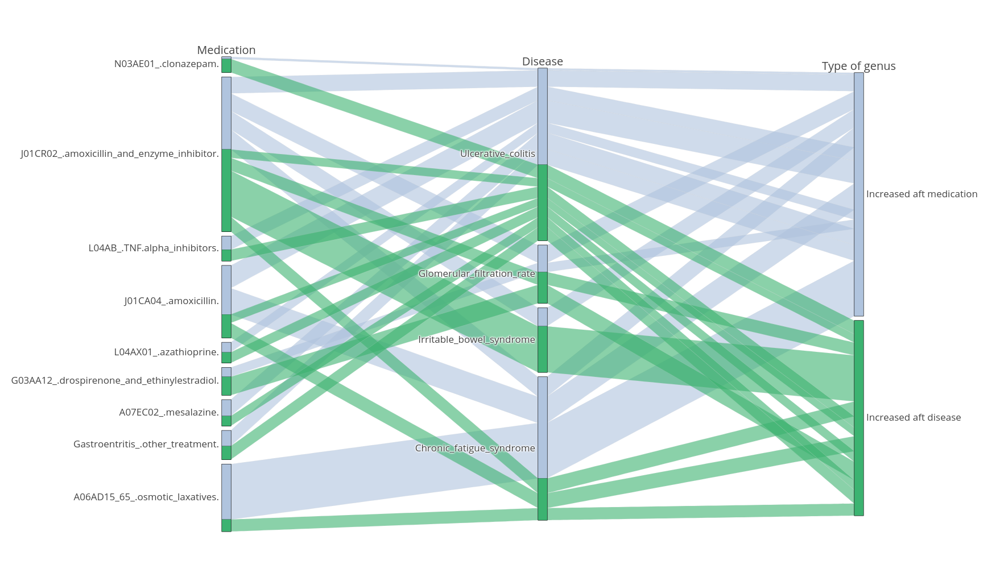

In [43]:
med_dim = go.parcats.Dimension(
    values=sto_df.med,
    label="Medication"
)

dis_dim = go.parcats.Dimension(
    values=sto_df.dis ,
    label="Disease")
type_dim = go.parcats.Dimension(
    values=sto_df.loc[:,'type'] ,
    label="Type of genus",
    categoryarray=['increased aft med', 'increased aft dis'],
    ticktext=['Increased aft medication', 'Increased aft disease'],)
    
color = [1 if _ == 'increased aft dis' else 0 for _ in sto_df.loc[:,'type']];
colorscale = [[0, 'lightsteelblue'], [1, 'mediumseagreen']];
    
tmp = go.Figure()
tmp.add_parcats(
        dimensions=[med_dim, dis_dim,type_dim],
            line={'color': color,
              'colorscale': colorscale},
        hoveron='color',
    arrangement='freeform'
    )
tmp.layout.margin.l = 350
tmp.layout.margin.r = 200
tmp.layout.width = 2200
tmp.layout.height = 1000
tmp.layout.font.size = 20
plotly.offline.iplot(tmp)

## Stratification with different method

This is the format of your plot grid:
[ (1,1) x1,y1 ]



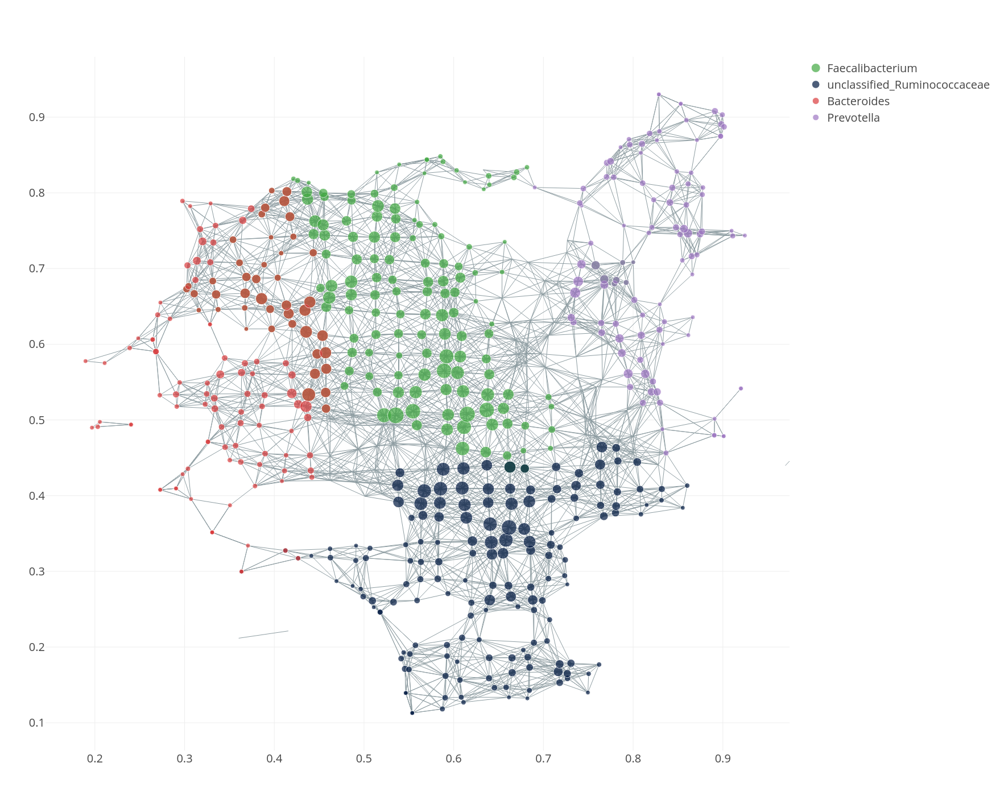

In [44]:
# Act like traditional enterotype
node_pos = graph.nodePos
nodes = graph.node
sizes = graph.size

enriched_centroides = get_significant_nodes(graph=graph,
                                 safe_scores=enriched_SAFE_total,
                                 pvalue=0.05,
                                 n_iter=5000
                                 )
xs = []
ys = []
for edge in graph.edges:
    xs += [node_pos[edge[0], 0],
           node_pos[edge[1], 0],
           None]
    ys += [node_pos[edge[0], 1],
           node_pos[edge[1], 1],
           None]
fig = plotly.tools.make_subplots(1,1)


node_line = go.Scatter(
    # ordination line
    visible=True,
    x=xs,
    y=ys,
    marker=dict(color="#8E9DA2",
                opacity=0.7),
    line=dict(width=1),
    showlegend=False,
    mode="lines")
fig.append_trace(node_line, 1, 1)

color_tmp = {'Bacteroides':'#da3c3d',
            'unclassified_Ruminococcaceae':'#011941',
             'Faecalibacterium':'#41a941',
            'Prevotella':'#9e76c3'}

for idx,fea in enumerate(['Faecalibacterium','unclassified_Ruminococcaceae','Bacteroides','Prevotella']):
    node_position = go.Scatter(
        # node position
        visible=True,
        x=node_pos[enriched_centroides[fea], 0],
        y=node_pos[enriched_centroides[fea], 1],
        hoverinfo="text",
        marker=dict(#color=node_colors,
                    color=color_tmp[fea],
                    size=[5 + sizes[_] for _ in enriched_centroides[fea]],
                    opacity=0.7),
        showlegend=True,
        name = fea,
        mode="markers")
    fig.append_trace(node_position, 1,1)
fig.layout.width = 1600
fig.layout.height = 1400
fig.layout.font.size = 20
plotly.offline.iplot(fig)

This is the format of your plot grid:
[ (1,1) x1,y1 ]



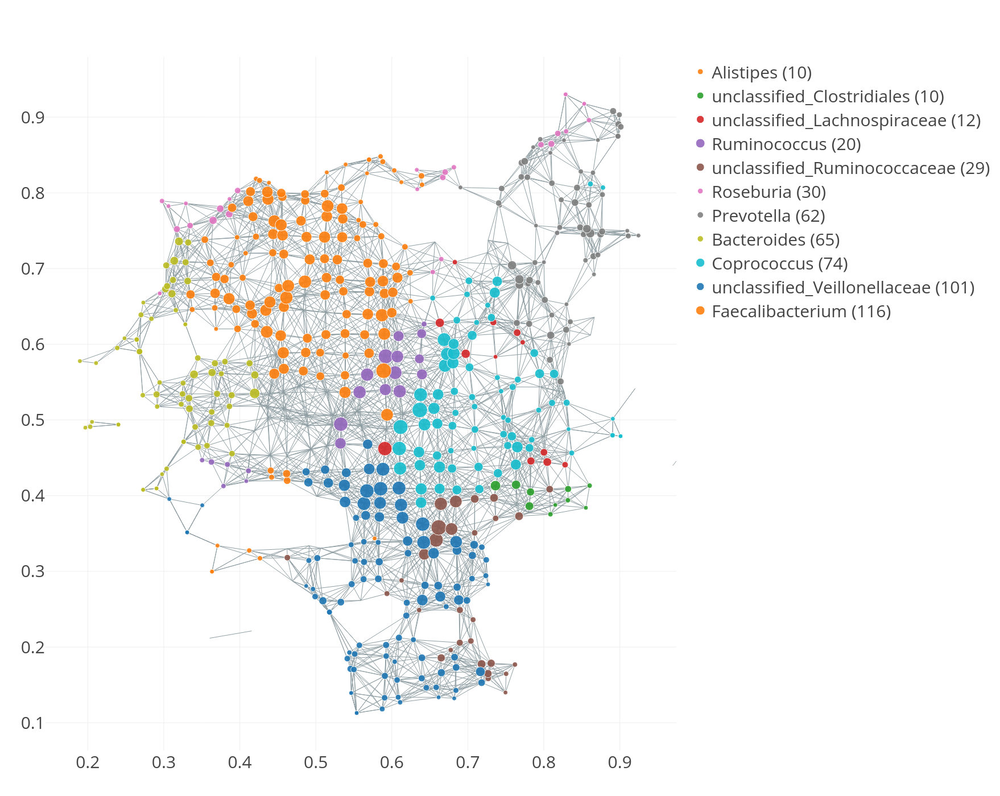

In [45]:
# Enterotyping-like stratification map based on SAFE score
node_pos = graph.nodePos
nodes = graph.node
sizes = graph.size

xs = []
ys = []
for edge in graph.edges:
    xs += [node_pos[edge[0], 0],
           node_pos[edge[1], 0],
           None]
    ys += [node_pos[edge[0], 1],
           node_pos[edge[1], 1],
           None]
fig = plotly.tools.make_subplots(1, 1)

node_line = go.Scatter(
    # ordination line
    visible=True,
    x=xs,
    y=ys,
    marker=dict(color="#8E9DA2",
                opacity=0.7),
    line=dict(width=1),
    showlegend=False,
    mode="lines")
fig.append_trace(node_line, 1, 1)

safe_score_df = pd.DataFrame.from_dict(enriched_SAFE)
min_p_value = 1.0 / (5000 + 1.0)
threshold = np.log10(0.05) / np.log10(min_p_value)
tmp = [safe_score_df.columns[_] if safe_score_df.iloc[idx, _] > threshold else np.nan for idx, _ in enumerate(np.argmax(safe_score_df.values, axis=1))]
t = Counter(tmp)
for idx, fea in enumerate([_ for _, v in sorted(t.items(), key=lambda x: x[1]) if v >= 10]):
    # safe higher than threshold, just centroides
    node_position = go.Scatter(
        # node position
        visible=True,
        x=node_pos[np.array(tmp) == fea, 0],
        y=node_pos[np.array(tmp) == fea, 1],
        hoverinfo="text",
        marker=dict(  # color=node_colors,
            size=[5 + sizes[_] for _ in np.arange(node_pos.shape[0])[np.array(tmp) == fea]],
            opacity=0.9),
        showlegend=True,
        name=fea + ' (%s)' % str(t[fea]),
        mode="markers")
    fig.append_trace(node_position, 1, 1)
fig.layout.width = 1600
fig.layout.height = 1400
fig.layout.font.size = 30
fig.layout.hovermode = 'closest'
plotly.offline.iplot(fig)